In [155]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import qstock as qs

import talib

import cvxopt as opt
from cvxopt import blas,solvers
solvers.options['show_progress'] = False #求解器只输出结果不打印过程
from scipy.optimize import minimize
# 需要计算或填充的变量：
# 账面市值比（PB倒数）
# 流通市值
# 息税前利润
# 股东权益合计（不含少数股东）
# 总资产
# 收盘价
import cvxpy as cp
import mysql.connector
import scipy.optimize as sco
from sklearn.linear_model import LinearRegression
from scipy.stats import zscore

In [8]:
mydb = mysql.connector.connect(
      host="172.31.50.91",
      user="guest",
      password="MH#123456",
       database="astocks"
    )
query1 = "SELECT td, chg,close, codenum,total_share,float_share,vol FROM market WHERE td >= 20100101"

df1 = pd.read_sql(query1, mydb)
df1 = df1.sort_values(by=['td'])


C:\Users\19550\AppData\Local\Temp\ipykernel_8652\921821895.py:9: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df1 = pd.read_sql(query1, mydb)


In [9]:
query2 = "SELECT fd,codenum, total_assets,total_liabilities,EBIT,total_shareholders_equity,net_profit FROM finance WHERE fd >= 20091231"

df2 = pd.read_sql(query2, mydb)
df2 = df2.sort_values(by=['fd'])

C:\Users\19550\AppData\Local\Temp\ipykernel_8652\708864054.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df2 = pd.read_sql(query2, mydb)


In [10]:
query_deriv = "SELECT fd,codenum,EPS FROM finance_deriv WHERE fd >= 20091231"

df_deriv = pd.read_sql(query_deriv, mydb)
df_deriv = df_deriv.sort_values(by=['fd'])

df2 = pd.merge(df_deriv, df2, on=['codenum', 'fd'], how='outer')

C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3184171008.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_deriv = pd.read_sql(query_deriv, mydb)


In [11]:
def push_date(date):
    t = str(date)
    y,m = int(t[0:4]),t[4:6]
    if m == '03':
        return int((y)*1e4+4*1e2+30)
    elif m == '06':
        return int((y)*1e4+8*1e2+30)
    elif m == '09':
        return int((y)*1e4+10*1e2+31)
    else:
        return int((y+1)*1e4+4*1e2+30)

In [12]:
temp_list = []
for i in df2['fd']:
    temp_list += [push_date(i)]
df2['temp_list'] =(temp_list)

In [13]:
TTM = df2.groupby(by=["codenum"])[['EPS','total_assets','total_liabilities','EBIT','total_shareholders_equity','net_profit']].rolling(4, min_periods=4).mean()

In [14]:
TTM = TTM.reset_index()
TTM = TTM.set_index('level_1')

In [15]:
df2['EPS'] = TTM['EPS']
df2['total_assets'] = TTM['total_assets']
df2['total_liabilities'] = TTM['total_liabilities']
df2['EBIT'] = TTM['EBIT']
df2['total_shareholders_equity'] = TTM['total_shareholders_equity']
df2['net_profit'] = TTM['net_profit']

In [16]:

df2 = df2.sort_values(['codenum','fd']).reset_index(drop = True)

In [17]:
df2 = df2[~df2.duplicated(subset=['codenum', 'temp_list'], keep='last')]
df2['df'] = df2['temp_list']
df2 = df2.drop(columns = ['temp_list'])

In [18]:
query3 = "SELECT td, chg,codenum FROM market WHERE td >= 20100101"

df3 = pd.read_sql(query3, mydb)
df3 = df3.sort_values(by=['td'])

C:\Users\19550\AppData\Local\Temp\ipykernel_8652\1535748614.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df3 = pd.read_sql(query3, mydb)


In [19]:
df1 = df1.reset_index(drop = True)
df2 = df2.reset_index(drop = True)
df2['td'] = df2['fd']

merged_df = pd.merge(df1, df2, on=['codenum', 'td'], how='outer')
merged_df = merged_df.sort_values(['codenum','td'], ascending=True)
merged_df['total_assets'].fillna(method='ffill', inplace=True)
merged_df['total_liabilities'].fillna(method='ffill', inplace=True)
merged_df['EBIT'].fillna(method='ffill', inplace=True)
merged_df['EPS'].fillna(method='ffill', inplace=True)
merged_df['total_shareholders_equity'].fillna(method='ffill', inplace=True)
merged_df['net_profit'].fillna(method='ffill', inplace=True)

In [20]:
merged_df = merged_df.drop(columns=['fd','df'])
merged_df = merged_df.dropna()
# 计算doc（Book-to-Market Ratio）
merged_df['Book_Value'] = (merged_df['total_assets']-merged_df['total_liabilities'])
merged_df['Book_to_Market_Ratio'] = merged_df['Book_Value']/(merged_df['close'] * merged_df['total_share'])
# 计算流通市值（Market Capitalization）
merged_df['Market_Cap'] = merged_df['close'] * merged_df['float_share']

merged_df['PE'] = merged_df['close']/merged_df['EPS']
merged_df['ROE'] = merged_df['net_profit']/merged_df['total_shareholders_equity']

In [21]:
#已计算完成的变量
cap=merged_df.pivot(index='td', columns='codenum', values='Market_Cap')
close=merged_df.pivot(index='td', columns='codenum', values='close')
bm=merged_df.pivot(index='td', columns='codenum', values='Book_to_Market_Ratio')
ebit=merged_df.pivot(index='td', columns='codenum', values='EBIT')
equity=merged_df.pivot(index='td', columns='codenum', values='total_shareholders_equity')
totasset=merged_df.pivot(index='td', columns='codenum', values='total_assets')
chg = df3.pivot(index='td', columns='codenum', values='chg')
chg = chg. fillna(0)
totasset = totasset.fillna(0)
daily_ret_matrix = close.pct_change(-1).fillna(0)
# daily_ret_matrix

具体分组

In [22]:
#提取构造时间序列以提取特定日期的数据
floatlist=cap.index
#index转化为str
datelist=pd.to_datetime(floatlist.astype("int").astype("str"))

#ALLapool可交易股票池
allapool=pd.DataFrame(index=floatlist,columns=cap.columns)
allapool[close>0]=1
allapool=allapool.fillna(0)
#allapool为构建的有效股票池（可以交易的股票），除去了缺失值

bm.set_index(floatlist,inplace=True)
totasset.set_index(floatlist,inplace=True)


#因子构建

bm=bm*allapool#将bm中不可交易的股票去除
cap=cap*allapool#将市值中不可交易的股票去除
pro=(ebit/equity)*allapool #构造盈利能力指标、将盈利能力中不可交易的股票去除

totasset=totasset*allapool#将总资产中不可交易的股票去除


#提取不同数据集相应月份的数据，对应五因子构造
cap_d=cap.set_index(datelist)
cap_m=cap_d.groupby([cap_d.index.year,cap_d.index.month]).tail(1)
# cap_may=cap_m[cap_m.index.month==5]

bm_d=bm.set_index(datelist)
bm_m=bm_d.groupby([bm_d.index.year,bm_d.index.month]).tail(1)
# bm_may=bm_m[bm_m.index.month==5]

pro_d=pro.set_index(datelist)
pro_m=pro_d.groupby([pro_d.index.year,pro_d.index.month]).tail(1)
# pro_may=pro_m[pro_m.index.month==5]

totasset_d=totasset.set_index(datelist)
totasset_m= totasset_d.groupby([totasset_d.index.year,totasset_d.index.month]).tail(1)
totasset_dec =totasset_m[totasset_m.index.month==12]

inv = (totasset_dec.shift(-1)-totasset_dec)/totasset_dec
inv = pd.DataFrame(inv,index=totasset_d.index,columns=totasset.columns)
inv = inv.fillna(method='ffill') 
inv.replace([np.inf, -np.inf], 0, inplace=True)
inv_m = inv.groupby([inv.index.year,inv.index.month]).tail(1)
# inv_may = inv_may[ (inv_may.index.month==5) ]



In [23]:
pe = merged_df.pivot(index='td', columns='codenum', values='PE')
pe = pe * allapool
pe = pe.fillna(10e5)
roe = merged_df.pivot(index='td', columns='codenum', values='ROE')
roe = roe * allapool
roe = roe.fillna(0)

In [24]:
pe_d=pe.set_index(datelist)
pe_m=pe_d.groupby([pe_d.index.year,pe_d.index.month]).tail(1)

In [25]:
pe_d[pe_d < 0] = 100000

In [26]:
pe_m_mean = pe_d.groupby([pe_d.index.year,pe_d.index.month]).mean()
pe_m_mean

codenum       000002.SZ       000004.SZ  000005.SZ      000006.SZ  \
td   td                                                             
2010 1   1000000.000000  1000000.000000   100000.0  100000.000000   
     2   1000000.000000   533342.474663   100000.0  160000.000000   
     3   1000000.000000    43500.721637   100000.0  100000.000000   
     4   1000000.000000       23.687402   100000.0  142857.142857   
     5   1000000.000000   100017.206886   100000.0  100000.000000   
...                 ...             ...        ...            ...   
2023 4        31.799807   100000.000000   100000.0      73.936395   
     5        30.404321   100000.000000   100000.0      70.760089   
     6        29.519277   100000.000000   100000.0      68.670599   
     7        29.107433   100000.000000   100000.0      67.772979   
     8        30.564863   100000.000000   100000.0      77.452405   

codenum      000007.SZ  000008.SZ      000009.SZ       000010.SZ  \
td   td                                                            
2010 1    50100.749101   640000.0  100000.000000       99.065838   
     2      106.115347   160000.0  100000.000000    66760.514543   
     3      111.913630   100000.0  139130.434783      110.412696   
     4   142957.251408   100000.0  100000.000000   333414.645328   
     5   200083.230104   685000.0  100000.000000  1000000.000000   
...                ...        ...            ...             ...   
2023 4   100000.000000   100000.0      93.506409   100000.000000   
     5   100000.000000   100000.0      93.596408   100000.000000   
     6   100000.000000   100000.0     100.495015   100000.000000   
     7   100000.000000   100000.0      97.837037   100000.000000   
     8   100000.000000   100000.0      94.191549   100000.000000   

codenum      000011.SZ     000012.SZ  ...       873122.BJ       873152.BJ  \
td   td                               ...                                   
2010 1   100000.000000    135.313978  ...  1000000.000000  1000000.000000   
     2   100000.000000    130.928902  ...  1000000.000000  1000000.000000   
     3   139130.434783  43621.906042  ...  1000000.000000  1000000.000000   
     4   100000.000000  47778.671484  ...  1000000.000000  1000000.000000   
     5   100000.000000    111.844594  ...  1000000.000000  1000000.000000   
...                ...           ...  ...             ...             ...   
2023 4       72.372481     39.864512  ...      107.907995      115.582185   
     5       69.994577     38.353628  ...      124.207656      113.433618   
     6       68.232395     36.097709  ...      121.365936    50078.700942   
     7       68.555547     35.865312  ...      117.303770    47689.894635   
     8       75.104904     36.562074  ...      111.699189       66.692226   

codenum       873167.BJ       873169.BJ       873223.BJ       873305.BJ  \
td   td                                                                   
2010 1   1000000.000000  1000000.000000  1000000.000000  1000000.000000   
     2   1000000.000000  1000000.000000  1000000.000000  1000000.000000   
     3   1000000.000000  1000000.000000  1000000.000000  1000000.000000   
     4   1000000.000000  1000000.000000  1000000.000000  1000000.000000   
     5   1000000.000000  1000000.000000  1000000.000000  1000000.000000   
...                 ...             ...             ...             ...   
2023 4        89.898401       57.753897     2807.423263     8834.231183   
     5        96.304907       54.607974     2675.946721     9085.410598   
     6     50084.070813       51.650529     2558.092993    58480.131640   
     7     47704.420537       52.620104     2616.289228    56917.314968   
     8        89.073220       52.123136     2571.434925     9567.054324   

codenum       873339.BJ       873527.BJ       873576.BJ       873593.BJ  
td   td                                                                  
2010 1   1000000.000000  1000000.000000  1000000.000000  1000000.000000  
     2   1000000.

In [27]:
roe_d=roe.set_index(datelist)
roe_m=roe_d.groupby([roe_d.index.year,roe_d.index.month]).tail(1)



In [28]:
 #市值加权持仓函数,根据每月数据计算日频持仓
def to_integer(dt_time):
    return 10000*dt_time.year + 100*dt_time.month + dt_time.day
def get_score(stocklist):
    pos=pd.DataFrame(stocklist,index=cap_d[(cap_d.index>= (stocklist.index[0])) & (cap_d.index<= (stocklist.index[-1]))].index,columns=cap.columns)
    pos=pos.fillna(method="ffill")
    pos=pos.set_index(to_integer(pos.index))
    pos=pos*allapool[(allapool.index>= (pos.index[0])) & (allapool.index<= (pos.index[-1]))]
    #根据市值加权计算持股比例
    cap_temp = cap[(cap.index>= (pos.index[0])) & (cap.index<= (pos.index[-1]))]
    score=((pos*cap_temp).T/(pos*cap_temp).sum(axis=1)).T
    return score
def bmk(df):
#     df.index=datelist
    df1=df["close"].pct_change()
    df1=(df1+1).cumprod()
    return df1


    



#马科维茨优化持股
def opt_portfolio(returns):
    n = len(returns)
    returns = np.asmatrix(returns)
    if n == 1:
        return [1]
    N = 100
    mus = [10** (5.0 * t/N - 1.0) for t in range(N)]
    
    S,pbar = opt.matrix(np.cov(returns)),opt.matrix(np.mean(returns,axis =1))

    G = -opt.matrix(np.eye(n))
    h = opt.matrix(0.0,(n,1))
    A = opt.matrix(1.0,(1,n))
    b = opt.matrix(1.0)

    portfolios = [solvers.qp(mu * S,-pbar,G,h,A,b)['x'] for mu in mus]

    returns = [blas.dot(pbar,x) for x in portfolios]
    risks = [np.sqrt(blas.dot(x,S*x)) for x in portfolios]
    m1 = np.polyfit(returns,risks,2)
    x1 = np.sqrt(m1[2]/m1[0])

    weights = solvers.qp(opt.matrix(x1*S),-pbar,G,h,A,b) ['x']
    return np.asarray(weights),returns,risks
def opt_score(stocklist):
    pos=pd.DataFrame(stocklist,index=cap_m.index,columns=cap.columns)
    pos = pos.set_index(cap_m.index.strftime("%Y%m%d").astype('int64'))
    
    for index, row in pos.iterrows():
        
        #得到可选的股票列表
        print(index)
        stocks_with_ones = row[row == 1 ].index.tolist()
        
        try:
        #获取每一支股票前一段时间的回报率，此处选择30天
        # print(stocks_with_ones)
            temp_df = chg[(chg.index <= index)][stocks_with_ones].tail(30)
            
            weights = opt_portfolio(temp_df.T)[0]
            weights = list(weights)
        # print(index)
        except:
            weights = []
            for stock in stocks_with_ones:
                weights += [cap[cap.index == index][stock].values[0]]
        
            weights = np.array(weights)
            weights = weights/ sum(weights)
        # #将其反馈到原本的比例
    for i in range(len(stocks_with_ones)):
        pos.at[index,stocks_with_ones[i]]=weights[i]
        
    
    pos=pos.reindex(floatlist.astype('int64'))
    pos=pos.fillna(method="ffill")
    pos=pos*allapool
    return pos

#输出图像，我用了qstock的沪深300，因为周末无法用内网；只要用国内网络即可，不要挂代理
def plot1(a,na):
    plt.rcParams['figure.figsize'] = (10, 6)
    plt.xlabel("time")
    plt.ylabel("return")
    #修改原数据的index
    try:
        a.index=pd.to_datetime(a.index.astype("int").astype("str"))
    except:
        pass
   
    time = str(a.index[0])
    end_time = str(a.index[-1])
    all_data=benchmark[(benchmark.index >= a.index[0])&(benchmark.index <= a.index[-1])]
    benchmark1 = (all_data.pct_change()+1).cumprod()
    
    plt.plot(benchmark1,label="benchmark")
    plt.plot(a,label=na)
    plt.grid()
    plt.show()
def sharpe_ratio_yearly(data):
    temp = data.pct_change(1).values[1:]
    return temp.mean()/ temp.std() *255**0.5


def calculate_drawdown(cumulative_returns):
    """
    计算最大回撤
    :param returns: 收益率数组
    :return: 最大回撤
    """
    
    # 计算历史峰值
    historical_peak = np.maximum.accumulate(cumulative_returns)
    
    # 计算回撤
    drawdown = (cumulative_returns - historical_peak) / historical_peak
    
    # 计算最大回撤(最小增幅)
    max_drawdown = np.min(drawdown)
    
    return max_drawdown
all_data=qs.get_data(code_list=['sh'],start='20090101',fqt=2)
benchmark = bmk(all_data)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.10it/s]


In [29]:
'''全局最大化期望收益率组合'''
def cal_expret(weights,df_stock):
    
    risk_free_rate = 0.03
    # if len(weights) != df_stock.shape[1]:
    #     raise Exception("the weights should be same size as stock list")
    weights = np.array(weights/np.sum(weights))
    returns_daily = np.log(df_stock/df_stock.shift(1)).iloc[1:,:]
    expected_return = np.sum(returns_daily.mean()*weights)*244-risk_free_rate
    return expected_return
    
def max_expret(df_stock):
    weight0 = [0] * len(df_stock.columns)
    stock_num = df_stock.shape[1]
    w_min = 1/(np.power(stock_num,1.5))
    w_max = 0.6
    df = df_stock
    def maxexpret(weights):
        return cal_expret(weights,df)*(-1) #minimize 
    cons = ({'type':'eq', 'fun':lambda x: np.sum(x)-1})
    bnds = tuple((w_min,w_max) for x in range(stock_num)) 
    optimize = sco.minimize(maxexpret, weight0 , method = 'SLSQP', bounds = bnds,constraints = cons)
    optim_weight = list(optimize['x'].round(4))
    
    return optim_weight
    
def max_score(stocklist):
    pos=pd.DataFrame(stocklist,index=cap_m.index,columns=cap.columns)
    pos = pos.set_index(cap_m.index.strftime("%Y%m%d").astype('int64'))
    #根据马科维茨优化计算持股比例
    # print(pos)
    for index, row in pos.iterrows():
        
        #得到可选的股票列表
        print(index)
        stocks_with_ones = row[row == 1 ].index.tolist()
        
        try:
        #获取每一支股票前一段时间的回报率，此处选择30天
        # print(stocks_with_ones)
            temp_df = chg[(chg.index <= index)][stocks_with_ones].tail(30)
            
            weights = maxexpret(temp_df)
            
        # print(index)
        except:
            weights = []
            for stock in stocks_with_ones:
                weights += [cap[cap.index == index][stock].values[0]]
        
            weights = np.array(weights)
            weights = weights/ sum(weights)
        # #将其反馈到原本的比例
    for i in range(len(stocks_with_ones)):
        pos.at[index,stocks_with_ones[i]]=weights[i]
        
    
    pos=pos.reindex(floatlist.astype('int64'))
    pos=pos.fillna(method="ffill")
    pos=pos*allapool
    return pos

In [30]:
#预定的优化器
def portfolio_mean_variance(closing_prices):
    # Extract the target date and previous X days of closing prices
    
    prices = closing_prices

    # Calculate returns and log returns
    returns = prices.pct_change().dropna()
    log_returns = np.log(prices / prices.shift(1)).dropna()

    # Calculate mean returns and covariance matrix
    mean_returns = log_returns.mean().values
    cov_matrix = log_returns.cov().values

    # Number of assets
    n_assets = len(mean_returns)

    # Define optimization variables (weights of each asset)
    weights = cp.Variable(n_assets, nonneg=True)

    # Define the risk aversion parameter (gamma)
    gamma = cp.Parameter(nonneg=True)

    # Define the portfolio return and risk (standard deviation)
    portfolio_return = mean_returns @ weights
    portfolio_std_dev = cp.norm(cp.matmul(cov_matrix, weights))

    # Define the objective function to minimize 1/2 * risk_factor - gamma * profit_factor
    objective = cp.Minimize(0.5 * portfolio_std_dev - gamma * portfolio_return)

    # Define the constraints (sum of weights is 1)
    constraints = [cp.sum(weights) == 1]

    # Create the problem and solve it for different values of gamma
    gammas = np.logspace (-2, 3, 100) # Range of gamma values to consider
    optimal_weights_list = []

    for gamma_val in gammas:
        gamma.value = gamma_val
        problem = cp.Problem(objective, constraints)
        problem.solve()
        optimal_weights_list.append(weights.value)

    # Calculate the efficient frontier based on different gamma values
    efficient_frontier = pd.DataFrame(optimal_weights_list, columns=returns.columns)

    return efficient_frontier


In [31]:
#算了夏普，没出错
def portfolio_mean_variance(closing_prices,  risk_free_rate=0.0):
    # Extract the target date and previous X days of closing prices
    
    prices = closing_prices
    # Calculate returns and log returns
    returns = prices.pct_change().dropna()
    log_returns = np.log(prices / prices.shift(1)).dropna()

    # Calculate mean returns and covariance matrix
    mean_returns = log_returns.mean().values
    cov_matrix = log_returns.cov().values

    # Number of assets
    n_assets = len(mean_returns)

    # Define optimization variables (weights of each asset)
    weights = cp.Variable(n_assets, nonneg=True)

    # Risk aversion parameter for the utility function
    gamma = cp.Parameter(nonneg=True)

    # Define the objective function as the Sharpe ratio
    portfolio_return = mean_returns @ weights
    portfolio_std_dev = cp.norm(cp.matmul(cov_matrix, weights))  # Using the norm function to calculate portfolio standard deviation
    sharpe_ratio = (portfolio_return - risk_free_rate) / portfolio_std_dev
    objective = cp.Maximize(sharpe_ratio)

    # Define the constraints (sum of weights is 1)
    constraints = [cp.sum(weights) == 1,cp.min(weights) >= 0]

    # Create the problem and solve it for different values of gamma
    gammas = np.logspace(-2, 3, 100)  # Range of gamma values to consider
    optimal_weights_list = []

    for gamma_val in gammas:
        gamma.value = gamma_val
        problem = cp.Problem(objective, constraints)
        problem.solve(qcp=True)
        optimal_weights_list.append(weights.value)

    # Calculate the efficient frontier based on different gamma values
    efficient_frontier = pd.DataFrame(optimal_weights_list, columns=returns.columns)

    return efficient_frontier


In [32]:
#算了夏普，会出错
def portfolio_mean_variance(closing_prices, risk_free_rate=0.0):
    # Extract the target date and previous X days of closing prices
    
    prices = closing_prices

    # Calculate returns and log returns
    returns = prices.pct_change().dropna()
    log_returns = np.log(prices / prices.shift(1)).dropna()

    # Calculate mean returns and covariance matrix
    mean_returns = log_returns.mean().values
    cov_matrix = log_returns.cov().values

    # Number of assets
    n_assets = len(mean_returns)

    # Define optimization variables (weights of each asset and max drawdown)
    weights = cp.Variable(n_assets, nonneg=True)
    max_drawdown = cp.Variable(nonneg=True)

    # Risk aversion parameter for the utility function
    gamma = cp.Parameter(nonneg=True)

    # Define the objective function as the utility function
    portfolio_return = mean_returns @ weights
    portfolio_std_dev = cp.norm(cp.matmul(cov_matrix, weights))  # Using the norm function to calculate portfolio standard deviation
    sharpe_ratio = (portfolio_return - risk_free_rate) / portfolio_std_dev
    utility = sharpe_ratio - gamma * max_drawdown
    objective = cp.Maximize(utility)

    # Define the constraints (sum of weights is 1, and max drawdown constraint)
    constraints = [cp.sum(weights) == 1,
                   max_drawdown <= max_drawdown_constraint(weights, log_returns)]

    # Create the problem and solve it for different values of gamma
    gammas = np.logspace(-2, 3, 100)  # Range of gamma values to consider
    optimal_weights_list = []

    for gamma_val in gammas:
        gamma.value = gamma_val
        problem = cp.Problem(objective, constraints)
        problem.solve()
        optimal_weights_list.append(weights.value)

    # Calculate the efficient frontier based on different gamma values
    efficient_frontier = pd.DataFrame(optimal_weights_list, columns=returns.columns)

    return efficient_frontier

def max_drawdown_constraint(weights, log_returns):
    portfolio_cumulative_returns = (1 + np.dot(log_returns, weights)).cumprod()
    max_return = np.maximum.accumulate(portfolio_cumulative_returns)
    drawdown = (max_return - portfolio_cumulative_returns) / max_return
    max_drawdown = np.max(drawdown)
    return max_drawdown


In [33]:
def opt_min_risk(stocklist):
    pos=pd.DataFrame(stocklist,index=cap_m[(cap_m.index>= (stocklist.index[0])) & (cap_m.index<= (stocklist.index[-1]))].index,columns=cap.columns)
    pos = pos.set_index(pos.index.strftime("%Y%m%d").astype('int64'))
    for index, row in pos.iterrows():
        #得到可选的股票列表
        stock_list = row[row == 1 ].index.tolist()
        print(stock_list)
        # print(len(stock_list))
        # try:
        #获取每一支股票前一段时间的回报率，此处选择30天
        # print(stocks_with_ones)
        len1 = len(stock_list)
        if len1 == 0:
            continue
            
        input =  daily_ret_matrix[(daily_ret_matrix.index <= index)][stock_list].tail(30) 
        a,b,c,d,e,f,g,h = 1,1,1,1,1,1,2,1.1
        # if len1 >= 20:
        #     h = 1

        input1 = a * pe_m_z [(pe_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1) +\
            b * bm_m_z[(bm_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1) +\
            c * pro_m_z[(pro_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1)+\
            d * inv_m_z[(inv_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1)+\
            e * cap_m_z[(cap_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1)-\
            f * pe_m_z[(pe_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1)
       
        # bm_m pro_m inv_m roe_m| cap_m pe_m    
        totasset_t = totasset[(totasset.index == index)][stock_list].mean(axis = 0)
        r_annualized = input1.mean(axis=0)
        daily_r_cov = input.cov()
        # turn into annual data
        
        cov_annualized = np.array(daily_r_cov * 252)
        r_min_annualized = 0.6

        cap_temp = cap[cap.index == index][stock_list].values
        
        cap_temp = cap_temp / np.sum(cap_temp)
        
        
        # create cvxpy variable to minimize
        w = cp.Variable(len(stock_list))
        bi_indicator = cp.Variable(len(stock_list),boolean = True)
        r_min = r_min_annualized / 252
        
        # construct the objective function and constraints
        #最小化波动
        # obj = cp.Minimize(w.T @ daily_r_cov @ w)
        #最大化滑动窗口收益率
        # obj = cp.Maximize(w.T @ totasset_t / 1e14 + w.T @ r_annualized - 1000 * (w.T @ daily_r_cov @ w))
        obj = cp.Maximize( g *(w.T @ r_annualized)  - 1/2 * (w.T @ daily_r_cov @ w))
        # obj = cp.Maximize( - 1/2 * (w.T @ daily_r_cov @ w))
        const = [
            cp.sum(w) == 1, w >= 0,
            # w.T @ r_annualized - r_min >= 0,
            # w >= bi_indicator * 0.005,
            # w <= bi_indicator * max(0.1,1.0/len1)
            w <= h * cap_temp[0]
        ]
        try:
        # solve it!
            prob = cp.Problem(obj, const)
            opt_v = prob.solve(solver = 'CPLEX',reoptimize=True,verbose=False)
            
            # risk_opt = (opt_v * 252) ** 0.5
            w_opt = w.value
            
            # print('optimal risk (%):', risk_opt)
            # print('optimal proportion:', np.round(w_opt, 4))
        except:
            w_opt = cap_temp[0]
           
        weights = pd.DataFrame([np.round(w_opt, 4)],columns = input.columns,index = [index])
        pos.update(weights)
        
        # print(index)
        # except:
            # print('failed')
            # weights = []
            # for stock in stock_list:
            #     weights += [cap[cap.index == index][stock].values[0]]
        
            # weights = np.array(weights)
            # weights = weights/ sum(weights)
        # #将其反馈到原本的比例
            # for i in range(len(stock_list)):
            #     pos.at[index,stock_list[i]]=weights[i]
    
    pos=pos.reindex(floatlist[(floatlist>= pos.index[0]) & (floatlist<= pos.index[-1])])
    pos=pos.fillna(method="ffill")
    
    pos=pos*allapool[(allapool.index>= pos.index[0]) & (allapool.index<=pos.index[-1])]
    return pos


In [202]:
def opt_min_risk(stocklist):
    pos=pd.DataFrame(stocklist,index=cap_m[(cap_m.index>= (stocklist.index[0])) & (cap_m.index<= (stocklist.index[-1]))].index,columns=cap.columns)
    pos = pos.set_index(pos.index.strftime("%Y%m%d").astype('int64'))
    for index, row in pos.iterrows():
        #得到可选的股票列表
        stock_list = row[row == 1 ].index.tolist()
        print(index)
        print(stock_list)
        # print(len(stock_list))
        # try:
        #获取每一支股票前一段时间的回报率，此处选择30天
        # print(stocks_with_ones)
        len1 = len(stock_list)
        if len1 == 0:
            continue
            
        input =  daily_ret_matrix[(daily_ret_matrix.index <= index)][stock_list].tail(15) 
        a,b,c,d,e,f,g,h = 1,1,1,1,1,1,2,1.1
        # if len1 >= 20:
        #     h = 1
        
        # input1 = a * pe_m_z [(pe_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1) +\
        #     b * bm_m_z[(bm_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1) +\
        #     c * pro_m_z[(pro_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1)+\
        #     d * inv_m_z[(inv_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1)+\
        #     e * cap_m_z[(cap_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1)-\
        #     f * pe_m_z[(pe_m_z.index <= pd.to_datetime(index, format='%Y%m%d'))][stock_list].tail(1)

        close_temp = close[close.index <= index][stock_list].tail(20)
        close_temp = close_temp.set_index(pd.to_datetime(close_temp.index, format='%Y%m%d'))
        input1 = []
        for i in stock_list:
            input1 += [cal_alpha(close_temp[i])[0]]
        input1 = np.array([input1])
        input1 = pd.DataFrame(input1,columns = stock_list,index = [index])
        # bm_m pro_m inv_m roe_m| cap_m pe_m    
        totasset_t = totasset[(totasset.index == index)][stock_list].mean(axis = 0)
        # r_annualized = input1.mean(axis=0)
        daily_r_cov = input.cov()
        # turn into annual data
        
        cov_annualized = np.array(daily_r_cov * 252)
        r_min_annualized = 0.6

        cap_temp = cap[cap.index == index][stock_list].values
        
        cap_temp = cap_temp / np.sum(cap_temp)
        
        
        # create cvxpy variable to minimize
        w = cp.Variable(len(stock_list))
        bi_indicator = cp.Variable(len(stock_list),boolean = True)
        r_min = r_min_annualized / 252
        
        # construct the objective function and constraints
        #最小化波动
        # obj = cp.Minimize(w.T @ daily_r_cov @ w)
        #最大化滑动窗口收益率
        # obj = cp.Maximize(w.T @ totasset_t / 1e14 + w.T @ r_annualized - 1000 * (w.T @ daily_r_cov @ w))
        # obj = cp.Maximize( g *(w.T @ r_annualized)  - 1/2 * (w.T @ daily_r_cov @ w))
        obj = cp.Maximize( g *(w.T @ input1.T)  - 1/2 * (w.T @ daily_r_cov @ w))
        # obj = cp.Maximize( - 1/2 * (w.T @ daily_r_cov @ w))
        const = [
            cp.sum(w) == 1, w >= 0,
            # w.T @ r_annualized - r_min >= 0,
            # w >= bi_indicator * 0.005,
            # w <= bi_indicator * max(0.1,1.0/len1)
            w <= h * cap_temp[0],
            # w <= 3 * 1.0/(len(stock_list))
        ]
        try:
        # solve it!
            prob = cp.Problem(obj, const)
            opt_v = prob.solve(solver = 'CPLEX',reoptimize=True,verbose=False)
            
            # risk_opt = (opt_v * 252) ** 0.5
            w_opt = w.value
            
            # print('optimal risk (%):', risk_opt)
            # print('optimal proportion:', np.round(w_opt, 4))
        except:
            w_opt = cap_temp[0]
           
        weights = pd.DataFrame([np.round(w_opt, 4)],columns = input.columns,index = [index])
        pos.update(weights)
        
        # print(index)
        # except:
            # print('failed')
            # weights = []
            # for stock in stock_list:
            #     weights += [cap[cap.index == index][stock].values[0]]
        
            # weights = np.array(weights)
            # weights = weights/ sum(weights)
        # #将其反馈到原本的比例
            # for i in range(len(stock_list)):
            #     pos.at[index,stock_list[i]]=weights[i]
    
    pos=pos.reindex(floatlist[(floatlist>= pos.index[0]) & (floatlist<= pos.index[-1])])
    pos=pos.fillna(method="ffill")
    
    pos=pos*allapool[(allapool.index>= pos.index[0]) & (allapool.index<=pos.index[-1])]
    return pos


In [35]:
import copy

In [129]:
chg_,chg__ = copy.deepcopy(chg),copy.deepcopy(chg)
chg_.index = pd.to_datetime(chg.index, format='%Y%m%d')
chg_ = (chg_/100 +1).cumprod()
max_drawback = 0.15

In [130]:
for i in chg_.columns:
    for _, month_data in chg_[i].resample('M'):
            historical_peak = ( np.maximum.accumulate(month_data))
            drawdown = (historical_peak - month_data) / historical_peak
            sell_all = False
            for idx, value in drawdown.items():
                if sell_all:
                    chg__[i].loc[int(idx.strftime('%Y%m%d'))] = 0        
                if value >= max_drawback:
                    sell_all = True
                 

In [170]:
#构造收益曲线；选取列表内的分组的并集构造选股策略
def output_ret(lis,type):
    temp = lis[0]
    for i in lis[1:]:
        temp = temp &i
    temp= temp * 1
    if type == 'get':
        score = get_score(temp)
    # score = opt_score(temp)
    elif type == 'opt1':
        score = opt_min_risk(temp)
    elif type ==  'opt2':
        score = opt_score2(temp)
    score=score.loc[~score.isna().all(axis=1)]
    ret=(chg__.loc[score.index].shift(-1)*score).sum(axis=1)
    
    # ret=(ret/100+1).cumprod()
    ret = ret/100
    ret = loss_ending(ret,0.1)
    ret=(ret+1).cumprod()
    return ret

In [89]:
import copy
def loss_ending(y,max_drawback):
    y_temp = copy.deepcopy(y)
    y_temp.index = pd.to_datetime(y.index, format='%Y%m%d')
    y_temp = (y_temp +1).cumprod()
    for _, month_data in y_temp.resample('M'):
        historical_peak = ( np.maximum.accumulate(month_data))
        drawdown = (historical_peak - month_data) / historical_peak
        sell_all = False
        for idx, value in drawdown.items():
            if sell_all:
                y[int(idx.strftime('%Y%m%d'))] = 0    
            if value >= max_drawback:
                sell_all = True
    return y


In [252]:
def cal_alpha_weekly(y):
    lis = []
    for i in range(0,len(y)-21,20):
        
        temp_y = y.iloc[i:i+21]
        lis +=  [cal_alpha(temp_y)]
    return lis

def cal_IR(y):
    x = benchmark[(benchmark.index >= y.index[0]) &(benchmark.index <= y.index[-1])]
    portfolio_returns = np.diff(y) / y[:-1]
    benchmark_returns = np.diff(x) / x[:-1]
    
    diff_returns = portfolio_returns - benchmark_returns
    annual_diff_returns = (np.mean(diff_returns)+1) **(250)-1


    
    annualized_std_deviation = np.std(diff_returns*250)
    return annual_diff_returns / annualized_std_deviation

def cal_win_rate(y):
    x = benchmark[(benchmark.index >= y.index[0]) &(benchmark.index <= y.index[-1])]
    x_ = x.pct_change()[1:]+1
    y_ = y.pct_change()[1:]+1
    count = sum(b >= a for a, b in zip(x_, y_))
    return float(count)/len(x_)

def cal_alpha(y):
    for i in y.values:
        if np.isnan(i):
            return [0,0]
    x = benchmark[(benchmark.index >= y.index[0]) &(benchmark.index <= y.index[-1])]
    x_ = (x.pct_change()[:]+1).fillna(1)
    y_ = (y.pct_change()[:]+1).fillna(1)
    x_ = x_.reset_index(drop = True)
    y_ = y_.reset_index(drop = True)
    intervals_x = x_.groupby((x_.index // 5) * 5)
    intervals_y = y_.groupby((y_.index // 5) * 5)
    Beta2 = np.cov(intervals_x.prod(),intervals_y.prod())[0,1]/np.var(intervals_x.prod())
    Alpha2 = (y[-1]/y[0])**(250/len(y))-1 - Beta2 * ((x[-1]/x[0])**(250/len(y))-1)
    # print('Beta: ',Beta2," Alpha: ",Alpha2)
    return Alpha2,Beta2



In [41]:
def calculate_zscores(column):
    return (column - column.expanding(min_periods=1).mean()) / column.expanding(min_periods=1).std()
# Calculate historical z-scores for each column
def his_zscore(df):
    historical_zscores = pd.DataFrame()
    for col in df.columns:
        historical_zscores[col] = calculate_zscores(df[col])
    return historical_zscores


# Calculate historical z-scores for each column


In [42]:

pe_m_z = his_zscore(pe_m)



C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfo

In [43]:
bm_m_z = his_zscore(bm_m)

C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfo

In [44]:
pro_m_z = his_zscore(pro_m)



C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfo

In [45]:
inv_m_z= his_zscore(inv_m)

C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfo

In [46]:
cap_m_z = his_zscore(cap_m)

C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfo

In [47]:
roe_m_z = his_zscore(roe_m)

C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  historical_zscores[col] = calculate_zscores(df[col])
C:\Users\19550\AppData\Local\Temp\ipykernel_8652\3604681126.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfo

In [48]:
#因子选股
H=bm_m.apply(lambda x:(x>= x.quantile(0.7)),axis=1)#选取bm前百分之30的股票组合
# M=bm_m_z.apply(lambda x:(x>=x.quantile(0.3))&(x<x.quantile(0.7)),axis=1)#选取bm值30%-70%的股票组合
# L=bm_m_z.apply(lambda x:x<x.quantile(0.3),axis=1)#选取bm后百分之30的股票组合
#以下同上
# B=cap_m_z.apply(lambda x:x>=x.quantile(0.5),axis=1)
S=cap_m.apply(lambda x:(x<x.quantile(0.5)),axis=1)

R=pro_m.apply(lambda x:(x>=x.quantile(0.7)),axis=1)
# W=pro_m_z.apply(lambda x:x<x.quantile(0.2),axis=1)

A=inv_m.apply(lambda x:(x>=x.quantile(0.7)),axis=1)
# C=inv_m_z.apply(lambda x:x<x.quantile(0.3),axis=1)


In [49]:

#调参因子选股
H=bm_m.apply(lambda x:(x>= x.quantile(0.7))&(x<=x.quantile(0.85)),axis=1)#选取bm前百分之30的股票组合
M=bm_m.apply(lambda x:(x>=x.quantile(0.3))&(x<x.quantile(0.7)),axis=1)#选取bm值30%-70%的股票组合
L=bm_m.apply(lambda x:x<x.quantile(0.3),axis=1)#选取bm后百分之30的股票组合
#以下同上
B=cap_m.apply(lambda x:x>=x.quantile(0.5),axis=1)
S=cap_m.apply(lambda x:(x>=x.quantile(0.11))&(x<x.quantile(0.39)),axis=1)

R=pro_m.apply(lambda x:(x>=x.quantile(0.6)),axis=1)
W=pro_m.apply(lambda x:x<x.quantile(0.2),axis=1)

A=inv_m.apply(lambda x:(x>=x.quantile(0.69))&(x<x.quantile(0.88)),axis=1)
C=inv_m.apply(lambda x:x<x.quantile(0.3),axis=1)


In [50]:
P_m_z = bm_m_z - cap_m_z + pro_m_z + inv_m

In [123]:
P = P_m_z.apply(lambda x:(x>x.quantile(0.9))&(x<x.quantile(1)),axis=1)

In [194]:
bm_m_z2 = bm_m.apply(zscore)
pro_m_z2 = pro_m.apply(zscore)

In [230]:
H=bm_m.apply(lambda x:(x>= x.quantile(0.7)),axis=1)#选取bm前百分之30的股票组合

S=cap_m.apply(lambda x:(x>x.quantile(0.1))&(x<=x.quantile(0.5)),axis=1)

R=pro_m.apply(lambda x:(x>=x.quantile(0.7)),axis=1)

A=inv_m.apply(lambda x:(x>=x.quantile(0.6))&(x<x.quantile(0.9)),axis=1)

In [52]:
def set_least_to_true(row):
    positive_values = row[row > 0]
    threshold1 = len(row) * 0.5
    threshold2 = len(row) * 0.1
    most_value = positive_values.nsmallest(int(threshold1)).iloc[-1]
    least_value = positive_values.nsmallest(int(threshold2)).iloc[-1]
    return (row <= most_value)&(row > least_value)

# Apply the function to each row using .apply and lambda
S=cap_m.apply(lambda row: set_least_to_true(row), axis=1)


In [53]:

PE_20 = pe_m.apply(lambda x:(((x>0) & (x <= 50)) ),axis=1)
ROE_15 = roe_m.apply(lambda x:(((x>=0.03) ) ),axis=1)

20210331
['002443.SZ', '002761.SZ', '002788.SZ', '600853.SH', '600865.SH', '601187.SH']
20210430
['000529.SZ', '002443.SZ', '002761.SZ', '002788.SZ', '600853.SH', '600865.SH', '601187.SH', '603458.SH', '603856.SH']
20210531
['000529.SZ', '002443.SZ', '002487.SZ', '002761.SZ', '002788.SZ', '002798.SZ', '600853.SH', '600865.SH', '601187.SH', '603357.SH', '603458.SH', '603856.SH']
20210630
['000529.SZ', '000755.SZ', '000922.SZ', '002443.SZ', '002487.SZ', '002753.SZ', '002761.SZ', '002788.SZ', '002798.SZ', '600802.SH', '600865.SH', '601187.SH', '603357.SH', '603458.SH', '603856.SH']
20210730
['000529.SZ', '000628.SZ', '000755.SZ', '000922.SZ', '002381.SZ', '002443.SZ', '002734.SZ', '002761.SZ', '002788.SZ', '002798.SZ', '600802.SH', '600865.SH', '601187.SH', '603238.SH', '603357.SH', '603458.SH', '603856.SH']
20210831
['000529.SZ', '000628.SZ', '002381.SZ', '002443.SZ', '002734.SZ', '002761.SZ', '002788.SZ', '002798.SZ', '600802.SH', '600865.SH', '601187.SH', '603238.SH', '603357.SH', '603

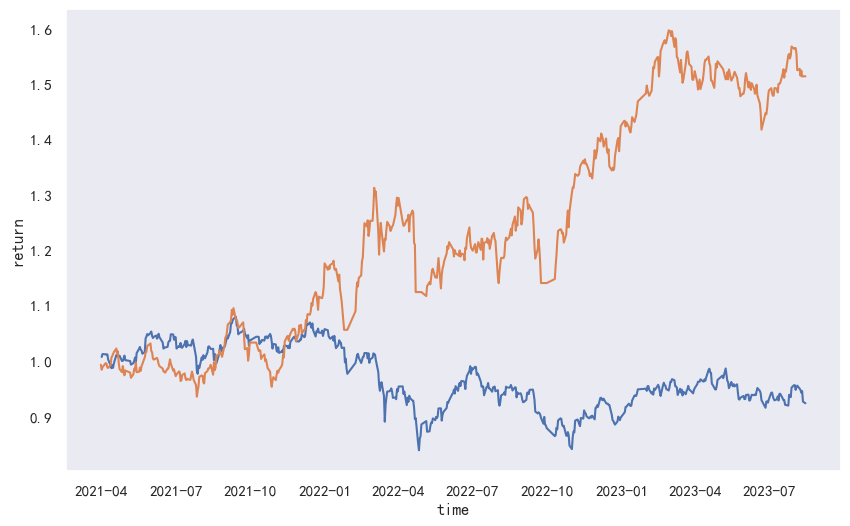

Sharpe:  1.0423129316430049
Drawdown: -0.14894850283500213
年化： 0.19692564313843808
Alpha:  0.22445885030638868  Beta:  0.7060466534846852
IR:  0.06584588745782809
0.5171897643841309 1.372707306890843
Win rate: 0.5104166666666666


In [244]:
ret_SRHA=output_ret([S[-30:],H[-30:],A[-30:],PE_20[-30:],R[-30:]],'opt1')
plot1(ret_SRHA,'SRHA')
print('Sharpe: ',sharpe_ratio_yearly(ret_SRHA))
print('Drawdown:',calculate_drawdown(ret_SRHA.values))
# alpha = calculate_alpha_with_factors(ret_SRHA.values, factors_data[-620:][:,3:4])
# print("Alpha:", alpha)
from sklearn.linear_model import LinearRegression

print('年化：',ret_SRHA[-1]**(250/len(ret_SRHA))-1)

# reg = LinearRegression().fit(factors_data[-620:][:,3:4].transpose().reshape(-1, 1),ret_SRHA.values)
# print('Beta: ',reg.coef_,'; Alpha: ',reg.intercept_ )
x,y = benchmark[(benchmark.index >= ret_SRHA.index[0]) &(benchmark.index <= ret_SRHA.index[-1])],ret_SRHA
y = y.reindex(x.index,method= 'ffill')
print('Alpha: ',cal_alpha(y)[0],' Beta: ',cal_alpha(y)[1])
print('IR: ', cal_IR(y))
print(np.mean(cal_alpha_weekly(y)),np.std(cal_alpha_weekly(y)))
print('Win rate:',cal_win_rate(y))

20180928
['600173.SH', '600393.SH', '603518.SH']
20181031
['000498.SZ', '600393.SH', '603518.SH']
20181130
['000498.SZ', '600173.SH', '600393.SH', '600665.SH', '600697.SH', '603518.SH']
20181228
['000553.SZ', '002133.SZ', '600173.SH']
20190131
['002133.SZ', '600173.SH', '601366.SH']
20190228
['002133.SZ', '600173.SH']
20190329
['002133.SZ', '600173.SH']
20190430
['600173.SH']
20190531
['600070.SH', '600173.SH']
20190628
['002061.SZ', '600070.SH', '600173.SH', '603113.SH']
20190731
['002133.SZ', '002788.SZ', '600173.SH']
20190830
['000736.SZ', '002133.SZ', '002478.SZ', '600070.SH', '600173.SH', '600287.SH', '600533.SH', '603113.SH', '603458.SH']
20190930
['000736.SZ', '002062.SZ', '002133.SZ', '002398.SZ', '002478.SZ', '002788.SZ', '600533.SH', '603458.SH', '603878.SH']
20191031
['002062.SZ', '002133.SZ', '002208.SZ', '002398.SZ', '002788.SZ', '600533.SH', '603113.SH', '603458.SH', '603878.SH']
20191129
['002062.SZ', '002094.SZ', '002133.SZ', '002398.SZ', '002788.SZ', '600533.SH', '6031

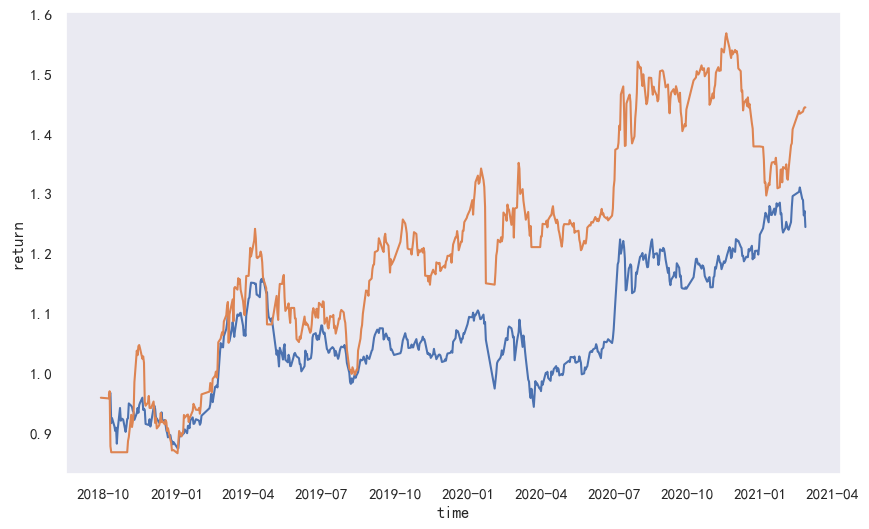

Sharpe:  0.8487270424763361
Drawdown: -0.1966917424214826
年化： 0.17095533455754253
Alpha:  0.12055365406508191  Beta:  0.7315247877358405
IR:  0.020052655036255838
0.6154017787370326 0.9902222519111894
Win rate: 0.5171821305841925


In [234]:
ret_SRHA=output_ret([S[-60:-30],H[-60:-30],A[-60:-30],PE_20[-60:-30],R[-60:-30]],'opt1')
plot1(ret_SRHA,'SRHA')
print('Sharpe: ',sharpe_ratio_yearly(ret_SRHA))
print('Drawdown:',calculate_drawdown(ret_SRHA.values))
# alpha = calculate_alpha_with_factors(ret_SRHA.values, factors_data[-620:][:,3:4])
# print("Alpha:", alpha)
from sklearn.linear_model import LinearRegression

print('年化：',ret_SRHA[-1]**(250/len(ret_SRHA))-1)

# reg = LinearRegression().fit(factors_data[-620:][:,3:4].transpose().reshape(-1, 1),ret_SRHA.values)
# print('Beta: ',reg.coef_,'; Alpha: ',reg.intercept_ )
x,y = benchmark[(benchmark.index >= ret_SRHA.index[0]) &(benchmark.index <= ret_SRHA.index[-1])],ret_SRHA
y = y.reindex(x.index,method= 'ffill')
print('Alpha: ',cal_alpha(y)[0],' Beta: ',cal_alpha(y)[1])
print('IR: ', cal_IR(y))
print(np.mean(cal_alpha_weekly(y)),np.std(cal_alpha_weekly(y)))
print('Win rate:',cal_win_rate(y))

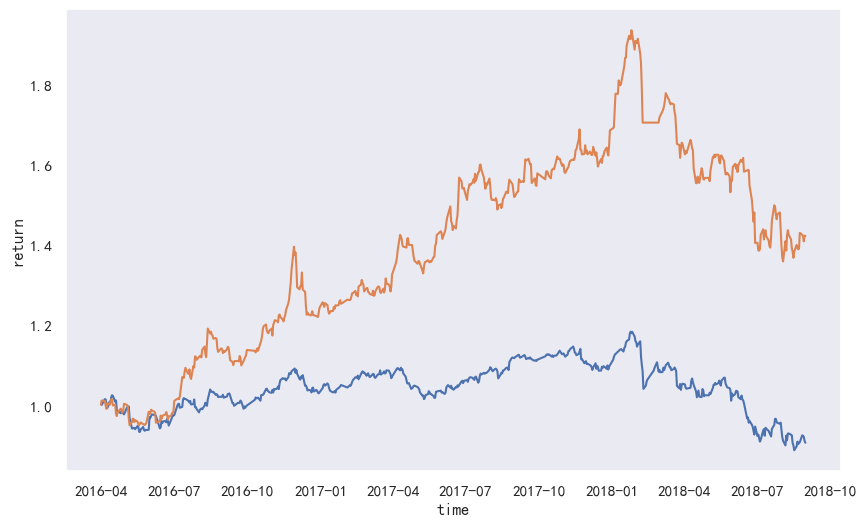

Sharpe:  0.9068449674069795
Drawdown: -0.29818027468717273
年化： 0.1606456491578827
Alpha:  0.19407871647839278  Beta:  0.862465717581803
IR:  0.06170867252368373
0.7629927888742634 1.2281880248122388
Win rate: 0.5008431703204047


In [245]:
ret_SRHA=output_ret([H[-90:-60],A[-90:-60],PE_20[-90:-60],R[-90:-60]],'get')
plot1(ret_SRHA,'SRHA')
print('Sharpe: ',sharpe_ratio_yearly(ret_SRHA))
print('Drawdown:',calculate_drawdown(ret_SRHA.values))
# alpha = calculate_alpha_with_factors(ret_SRHA.values, factors_data[-620:][:,3:4])
# print("Alpha:", alpha)
from sklearn.linear_model import LinearRegression

print('年化：',ret_SRHA[-1]**(250/len(ret_SRHA))-1)

# reg = LinearRegression().fit(factors_data[-620:][:,3:4].transpose().reshape(-1, 1),ret_SRHA.values)
# print('Beta: ',reg.coef_,'; Alpha: ',reg.intercept_ )
x,y = benchmark[(benchmark.index >= ret_SRHA.index[0]) &(benchmark.index <= ret_SRHA.index[-1])],ret_SRHA
y = y.reindex(x.index,method= 'ffill')
print('Alpha: ',cal_alpha(y)[0],' Beta: ',cal_alpha(y)[1])
print('IR: ', cal_IR(y))
print(np.mean(cal_alpha_weekly(y)),np.std(cal_alpha_weekly(y)))
print('Win rate:',cal_win_rate(y))

20130930
['002662.SZ', '300040.SZ', '600785.SH', '601010.SH', '601636.SH']
20131031
['002662.SZ', '300040.SZ', '600785.SH', '601010.SH']
20131129
['300040.SZ', '600785.SH', '601010.SH']
20131231
['002133.SZ', '601518.SH']
20140130
['000537.SZ', '000589.SZ', '002133.SZ', '600697.SH', '601518.SH']
20140228
['000040.SZ', '002133.SZ', '600665.SH', '600697.SH', '601518.SH']
20140331
['000701.SZ', '002628.SZ', '600697.SH', '601518.SH']
20140430
['002062.SZ', '002628.SZ', '601518.SH']
20140530
['002062.SZ', '002628.SZ', '600039.SH', '600697.SH', '601518.SH']
20140630
['000537.SZ', '000656.SZ', '600039.SH', '600622.SH', '600697.SH', '601518.SH']
20140731
['000537.SZ', '000701.SZ', '600039.SH', '600622.SH', '600697.SH', '601518.SH']
20140829
['000537.SZ', '000701.SZ', '600622.SH', '600684.SH', '600697.SH', '601518.SH']
20140930
['000537.SZ', '600622.SH', '600697.SH']
20141031
['000537.SZ', '600622.SH', '600697.SH']
20141128
['600622.SH']
20141231
[]
20150130
[]
20150227
['603077.SH']
20150331
[

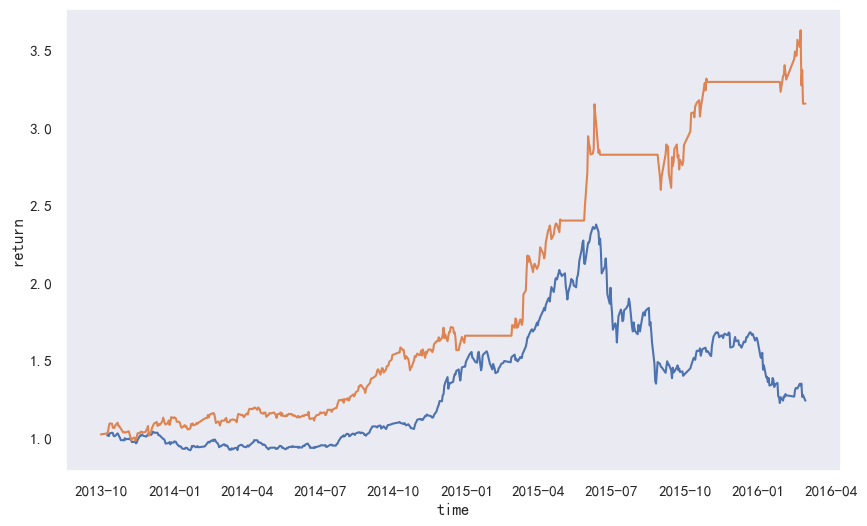

Sharpe:  1.9259896677733157
Drawdown: -0.1755881635912497
年化： 0.631868759267521
Alpha:  0.5868961817826093  Beta:  0.3435413589659869
IR:  0.07197122162943376
0.8275305290131393 1.640891307240961
Win rate: 0.5085324232081911


In [247]:
ret_SRHA=output_ret([S[-120:-90],H[-120:-90],A[-120:-90],PE_20[-120:-90],R[-120:-90]],'opt1')
plot1(ret_SRHA,'SRHA')
print('Sharpe: ',sharpe_ratio_yearly(ret_SRHA))
print('Drawdown:',calculate_drawdown(ret_SRHA.values))
# alpha = calculate_alpha_with_factors(ret_SRHA.values, factors_data[-620:][:,3:4])
# print("Alpha:", alpha)
from sklearn.linear_model import LinearRegression

print('年化：',ret_SRHA[-1]**(250/len(ret_SRHA))-1)

# reg = LinearRegression().fit(factors_data[-620:][:,3:4].transpose().reshape(-1, 1),ret_SRHA.values)
# print('Beta: ',reg.coef_,'; Alpha: ',reg.intercept_ )
x,y = benchmark[(benchmark.index >= ret_SRHA.index[0]) &(benchmark.index <= ret_SRHA.index[-1])],ret_SRHA
y = y.reindex(x.index,method= 'ffill')
print('Alpha: ',cal_alpha(y)[0],' Beta: ',cal_alpha(y)[1])
print('IR: ', cal_IR(y))
print(np.mean(cal_alpha_weekly(y)),np.std(cal_alpha_weekly(y)))
print('Win rate:',cal_win_rate(y))